# 1. Installing and importing necessary modules and libraries

In [1]:
##Installing Libraries

#!pip install geopy 
#!pip install folium
#pip install geopandas
#!pip install descartes
#!pip install xlrd
#!pip install lxml
#!pip install seaborn
#!pip install matplotlib==3.1.2
#!pip install matplotlib-venn


In [2]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import seaborn as sns 
import re #for data cleaning
import xlrd
import requests # library to handle requests
import json # library to handle JSON files
import folium # map rendering library
import geopandas
import descartes
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
%matplotlib inline
import matplotlib
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib import style

#import k-means from clustering stage
from sklearn.cluster import KMeans

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

print('Libraries imported.')

Libraries imported.


In [3]:
# Setting Up some library parameters

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

plt.rcParams['figure.dpi'] = 200

# 2.  Wikipedia Scraper with Results stored into a data frame

In [4]:
url1 = 'https://en.wikipedia.org/wiki/List_of_the_100_largest_municipalities_in_Canada_by_population'

url2 = 'Canada personal Income data .csv'

url3 = 'https://en.wikipedia.org/wiki/List_of_Canadian_provinces_by_unemployment_rate'


In [5]:
df1 = pd.read_html(url1,thousands=',')[0]  
df1 = df1[['Municipality', 'Province','Population(2016)', 'Land\xa0area(km2,\xa02011)']] # Extract relevant columns
df1 = df1.rename(columns = {'Municipality':'City', 'Population(2016)':'Population 2016', 
                            'Land\xa0area(km2,\xa02011)':'Area(km2, 2011)'})   #rename columns
df1.head()

,City,Province,Population 2016,"Area(km2, 2011)"
0,Toronto,Ontario,2731571,630.2
1,Montreal,Quebec,1704694,365.1
2,Calgary,Alberta,1239220,825.3
3,Ottawa,Ontario,934243,2790.2
4,Edmonton,Alberta,932546,684.4


### Data Cleaning

In [6]:
#check data type of columns
print(df1.dtypes)

#correct types
df1[['Population 2016','Area(km2, 2011)']] = df1[['Population 2016','Area(km2, 2011)']].apply(pd.to_numeric)

df1['Population/km2'] = (df1['Population 2016']// df1['Area(km2, 2011)']).astype(int)
df1.head()

City                object
Province            object
Population 2016      int64
Area(km2, 2011)    float64
dtype: object


,City,Province,Population 2016,"Area(km2, 2011)",Population/km2
0,Toronto,Ontario,2731571,630.2,4334
1,Montreal,Quebec,1704694,365.1,4669
2,Calgary,Alberta,1239220,825.3,1501
3,Ottawa,Ontario,934243,2790.2,334
4,Edmonton,Alberta,932546,684.4,1362


In [7]:
df1['City'] = df1.City.str.replace('\d+','')
df1["City"].replace([',[\D]*$'], [''], regex=True, inplace=True)
df1["City"]=df1["City"].str.encode('ascii','ignore').str.decode('ascii') #to remove ascii encoddings


In [8]:
#rename Lvis to Levis 

df1.at[32, 'City'] = 'Levis'

#rename Saint Jrme to Saint-Jereome
df1.at[74, 'City'] = 'Saint-Jerome'

#concatenate city with province 
df1['City'] = df1['City'] + ', ' + df1['Province']
df1.head()

,City,Province,Population 2016,"Area(km2, 2011)",Population/km2
0,"Toronto, Ontario",Ontario,2731571,630.2,4334
1,"Montreal, Quebec",Quebec,1704694,365.1,4669
2,"Calgary, Alberta",Alberta,1239220,825.3,1501
3,"Ottawa, Ontario",Ontario,934243,2790.2,334
4,"Edmonton, Alberta",Alberta,932546,684.4,1362


# 3. Adding Latitude and Longitude values (Geo Coordinates) to our data frame 

In [9]:
geolocator = Nominatim(user_agent="DE_explorerv3")

# iterate geocode to get and add coordinates of all cities
City_Lat = []
City_Long = []
for address in df1['City']:
    
    location = geolocator.geocode(address)
    if location:
        c_latitude = location.latitude
        c_longitude = location.longitude
        City_Lat.append(c_latitude)
        City_Long.append(c_longitude)
    else:
        print(address)

In [10]:
#checking if all cities have been parsed to new dataframes
print(len(City_Lat),len(City_Long),len(df1['City']))


100 100 100


In [11]:
df1['City_Lat']= City_Lat
df1['City_Long']= City_Long
df1.head(10)

,City,Province,Population 2016,"Area(km2, 2011)",Population/km2,City_Lat,City_Long
0,"Toronto, Ontario",Ontario,2731571,630.2,4334,43.653482,-79.383935
1,"Montreal, Quebec",Quebec,1704694,365.1,4669,45.497216,-73.610364
2,"Calgary, Alberta",Alberta,1239220,825.3,1501,51.053423,-114.062589
3,"Ottawa, Ontario",Ontario,934243,2790.2,334,45.421106,-75.690308
4,"Edmonton, Alberta",Alberta,932546,684.4,1362,53.535411,-113.507996
5,"Mississauga, Ontario",Ontario,721599,292.4,2467,43.589623,-79.644388
6,"Winnipeg, Manitoba",Manitoba,705224,464.1,1519,49.895537,-97.138458
7,"Vancouver, British Columbia",British Columbia,631486,115.0,5491,49.260872,-123.113953
8,"Brampton, Ontario",Ontario,593638,266.3,2229,43.685815,-79.759934
9,"Hamilton, Ontario",Ontario,536917,1117.2,480,43.256080,-79.872858


# 4. Getting Avg Income/Person Column to our data frame

Median income usually tends to show a better representation of the income distribution as such will be considered as our Average Income per person.

In [12]:
df2 = pd.read_csv(url2,thousands=',')
df2 = df2[['Province','Median income (excluding zeros)']]
df2.rename(columns = {'Median income (excluding zeros)':'Avg Income/ person CAD'}, inplace = True) 
df2.head()

,Province,Avg Income/ person CAD
0,Newfoundland and Labrador,33800
1,Prince Edward Island,34500
2,Nova Scotia,33800
3,New Brunswick,34300
4,Quebec,34700


In [13]:
DF=df1.merge(df2, on="Province")
DF.shape

(100, 8)

# 5. Getting Avg. Unemployment Rates to our data frame 

In [14]:
df3 = pd.read_html(url3,thousands=',')[0]
df3 = df3[['Province or territory','Unemployment rate (seasonally adjusted)']]
df3.rename(columns = {'Province or territory':'Province','Unemployment rate (seasonally adjusted)':'Average Unemployment rate'}, inplace = True) 
df3.at[6, 'Province'] = 'Quebec'
df3

,Province,Average Unemployment rate
0,Canada (national),10.2
1,British Columbia,10.7
2,Alberta,11.8
3,Saskatchewan,7.9
4,Manitoba,8.1
5,Ontario,10.6
6,Quebec,8.7
7,New Brunswick,9.4
8,Prince Edward Island,10.7
9,Nova Scotia,10.3


In [15]:
#combine all data into one dataframe
dfinal=DF.merge(df3, on="Province")
dfinal.head(20)

,City,Province,Population 2016,"Area(km2, 2011)",Population/km2,City_Lat,City_Long,Avg Income/ person CAD,Average Unemployment rate
0,"Toronto, Ontario",Ontario,2731571,630.2,4334,43.653482,-79.383935,36600,10.6
1,"Ottawa, Ontario",Ontario,934243,2790.2,334,45.421106,-75.690308,36600,10.6
2,"Mississauga, Ontario",Ontario,721599,292.4,2467,43.589623,-79.644388,36600,10.6
3,"Brampton, Ontario",Ontario,593638,266.3,2229,43.685815,-79.759934,36600,10.6
4,"Hamilton, Ontario",Ontario,536917,1117.2,480,43.256080,-79.872858,36600,10.6
5,"London, Ontario",Ontario,383822,420.6,912,42.983675,-81.249607,36600,10.6
6,"Markham, Ontario",Ontario,328966,212.6,1547,43.856371,-79.337682,36600,10.6
7,"Vaughan, Ontario",Ontario,306233,273.5,1119,43.794154,-79.526802,36600,10.6
8,"Kitchener, Ontario",Ontario,233222,136.8,1704,43.451291,-80.492782,36600,10.6
9,"Windsor, Ontario",Ontario,217188,146.3,1484,42.317099,-83.035343,36600,10.6


In [16]:
dfinal.shape

(100, 9)

# 7. Creating A Folium map for (Initial) Visualizing of Concerned Cities

In [17]:
map_Canada_Cities = folium.Map(location=[43.6532 , -79.3832], zoom_start=6) #toronto coordinates as starting point

# add markers to map
for lat, lng, city in zip(dfinal['City_Lat'], dfinal['City_Long'], dfinal['City']):
    label = '{}'.format(city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Canada_Cities)  
    
map_Canada_Cities

# 8. Getting suitable venue in concerned cities 

Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

### Define Foursquare Credentials and Version

In [18]:
CLIENT_ID = 'VVZJEH3WWZJSFTIIONF1V2R43A4XKO05GU330BRVUPPYWP2I' # your Foursquare ID
CLIENT_SECRET = 'NULW51FDZY5PYDMA5AW13ZKAX3V2NKTRFN5N3K3ISBY05PED' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: VVZJEH3WWZJSFTIIONF1V2R43A4XKO05GU330BRVUPPYWP2I
CLIENT_SECRET:NULW51FDZY5PYDMA5AW13ZKAX3V2NKTRFN5N3K3ISBY05PED


### Function to get all Cities' Venues

In [19]:
LIMIT = 300 
def getNearbyVenues(names, latitudes, longitudes, radius=1250):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['City', 
                  'City Latitude', 
                  'City Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [20]:
#Let's call the function :

Canada_venues = getNearbyVenues(names=df1['City'], 
                                latitudes=df1['City_Lat'], 
                                longitudes=df1['City_Long']
                               )
# It is a huge data frame with 5822 rows (=different venues) in it 
print(Canada_venues.shape)
Canada_venues.head(30)

Toronto, Ontario
Montreal, Quebec
Calgary, Alberta
Ottawa, Ontario
Edmonton, Alberta
Mississauga, Ontario
Winnipeg, Manitoba
Vancouver, British Columbia
Brampton, Ontario
Hamilton, Ontario
Quebec City, Quebec
Surrey, British Columbia
Laval, Quebec
Halifax, Nova Scotia
London, Ontario
Markham, Ontario
Vaughan, Ontario
Gatineau, Quebec
Saskatoon, Saskatchewan
Longueuil, Quebec
Kitchener, Ontario
Burnaby, British Columbia
Windsor, Ontario
Regina, Saskatchewan
Richmond, British Columbia
Richmond Hill, Ontario
Oakville, Ontario
Burlington, Ontario
Greater Sudbury, Ontario
Sherbrooke, Quebec
Oshawa, Ontario
Saguenay, Quebec
Levis, Quebec
Barrie, Ontario
Abbotsford, British Columbia
Coquitlam, British Columbia
Trois-Rivires, Quebec
St. Catharines, Ontario
Guelph, Ontario
Cambridge, Ontario
Whitby, Ontario
Kelowna, British Columbia
Kingston, Ontario
Ajax, Ontario
Langley, British Columbia
Saanich, British Columbia
Terrebonne, Quebec
Milton, Ontario
St. John's, Newfoundland and Labrador
Thunder

,City,City Latitude,City Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Toronto, Ontario",43.653482,-79.383935,Downtown Toronto,43.653232,-79.385296,Neighborhood
1,"Toronto, Ontario",43.653482,-79.383935,Nathan Phillips Square,43.652270,-79.383516,Plaza
2,"Toronto, Ontario",43.653482,-79.383935,Indigo,43.653515,-79.380696,Bookstore
3,"Toronto, Ontario",43.653482,-79.383935,Four Seasons Centre for the Performing Arts,43.650592,-79.385806,Concert Hall
4,"Toronto, Ontario",43.653482,-79.383935,Chatime 日出茶太,43.655542,-79.384684,Bubble Tea Shop
5,"Toronto, Ontario",43.653482,-79.383935,CF Toronto Eaton Centre,43.654447,-79.380952,Shopping Mall
6,"Toronto, Ontario",43.653482,-79.383935,Richmond Station,43.651569,-79.379266,American Restaurant
7,"Toronto, Ontario",43.653482,-79.383935,Elgin And Winter Garden Theatres,43.653394,-79.378507,Theater
8,"Toronto, Ontario",43.653482,-79.383935,UNIQLO ユニクロ,43.655910,-79.380641,Clothing Store
9,"Toronto, Ontario",43.653482,-79.383935,SEPHORA,43.653527,-79.380154,Cosmetics Shop


Now we will save all these venue results into a csv file .This will allow us to NOT the call foursquere api each time , (consuming our API daily limit , and waiting too long for the run.We made it once and saved the results , no need to rerun each time.!

In [21]:
Canada_venues.to_csv("Canada_venues.csv")

In [22]:
Canada_venues.shape

(4799, 7)

### Exploring the Canada Cities Venue Data Frame

In [23]:
Canada_venues = pd.read_csv("Canada_venues.csv", index_col='City') 
Canada_venues.drop(['City Latitude','City Longitude','Unnamed: 0'], axis=1, inplace=True)

In [24]:
Canada_venues.head(30)

,Venue,Venue Latitude,Venue Longitude,Venue Category
City,,,,
"Toronto, Ontario",Downtown Toronto,43.653232,-79.385296,Neighborhood
"Toronto, Ontario",Nathan Phillips Square,43.652270,-79.383516,Plaza
"Toronto, Ontario",Indigo,43.653515,-79.380696,Bookstore
"Toronto, Ontario",Four Seasons Centre for the Performing Arts,43.650592,-79.385806,Concert Hall
"Toronto, Ontario",Chatime 日出茶太,43.655542,-79.384684,Bubble Tea Shop
"Toronto, Ontario",CF Toronto Eaton Centre,43.654447,-79.380952,Shopping Mall
"Toronto, Ontario",Richmond Station,43.651569,-79.379266,American Restaurant
"Toronto, Ontario",Elgin And Winter Garden Theatres,43.653394,-79.378507,Theater
"Toronto, Ontario",UNIQLO ユニクロ,43.655910,-79.380641,Clothing Store


Let's check how many venues were returned for each City

In [25]:
Canada_venues[['Venue Category','Venue']].groupby('City').count().head(10)

,Venue Category,Venue
City,,
"Abbotsford, British Columbia",33,33
"Airdrie, Alberta",32,32
"Ajax, Ontario",58,58
"Aurora, Ontario",40,40
"Barrie, Ontario",59,59
"Belleville, Ontario",28,28
"Blainville, Quebec",15,15
"Brampton, Ontario",37,37
"Brantford, Ontario",33,33


Let's find out how many unique categories can be curated from all the returned venues

In [26]:
print('There are {} uniques categories.'.format(len(Canada_venues['Venue Category'].unique())))

There are 327 uniques categories.


### Analyzing Each City individually (Still Venue Data Frame)

In [27]:
# one hot encoding
Canada_onehot = pd.get_dummies(Canada_venues[['Venue Category']], prefix="", prefix_sep="")

In [28]:
Canada_onehot.head()

,ATM,African Restaurant,Airport,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Bowling Green,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cha Chaan Teng,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Bookstore,College Cafeteria,College Gym,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Inn,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Lighting Store,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Noodle House,Office,Optical Shop,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Rest Area,Restaurant,Road,Rock Climbing Spot,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / 

In [29]:
Canada_grouped = Canada_onehot.groupby('City').mean().reset_index()

In [30]:
Canada_grouped=Canada_grouped.round(decimals=2)

In [31]:
Canada_grouped.head(10)

,City,ATM,African Restaurant,Airport,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Bowling Green,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cha Chaan Teng,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Bookstore,College Cafeteria,College Gym,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Inn,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Lighting Store,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Noodle House,Office,Optical Shop,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Rest Area,Restaurant,Road,Rock Climbing Spot,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southe

In [32]:
Canada_grouped.shape

(96, 328)

**Lets extract the most 10 popular venues for each City :**
<p>We will use an iterative for loop to print top 10 frequent venues in the Cities ..</p>

In [33]:
num_top_venues = 10

for x in Canada_grouped['City']:
    print("----"+x+"----")
    temp =Canada_grouped[Canada_grouped['City'] == x].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbotsford, British Columbia----
                  venue  freq
0           Coffee Shop  0.12
1      Sushi Restaurant  0.09
2  Fast Food Restaurant  0.06
3        Sandwich Place  0.06
4              Pharmacy  0.06
5                  Bank  0.06
6           Gas Station  0.03
7      Greek Restaurant  0.03
8         Grocery Store  0.03
9                   Gym  0.03


----Airdrie, Alberta----
                           venue  freq
0                    Gas Station  0.12
1           Fast Food Restaurant  0.09
2                    Coffee Shop  0.09
3               Sushi Restaurant  0.06
4                            Gym  0.06
5                    Pizza Place  0.06
6                 Sandwich Place  0.03
7                    Supermarket  0.03
8                           Bank  0.03
9  Paper / Office Supplies Store  0.03


----Ajax, Ontario----
                  venue  freq
0           Coffee Shop  0.10
1  Fast Food Restaurant  0.09
2        Breakfast Spot  0.05
3         Grocery Store  0.05
4  

                   venue  freq
0             Restaurant  0.06
1                   Café  0.06
2            Coffee Shop  0.06
3         Sandwich Place  0.05
4  Vietnamese Restaurant  0.04
5            Pizza Place  0.04
6                  Diner  0.02
7              Nightclub  0.02
8                  Hotel  0.02
9     Chinese Restaurant  0.02


----Langley, British Columbia----
                   venue  freq
0                   Park  0.06
1             Restaurant  0.06
2       Sushi Restaurant  0.06
3            Coffee Shop  0.04
4         Sandwich Place  0.04
5     Mexican Restaurant  0.04
6          Grocery Store  0.04
7            Pizza Place  0.04
8  Vietnamese Restaurant  0.04
9             Steakhouse  0.02


----Laval, Quebec----
                  venue  freq
0            Restaurant  0.11
1              Pharmacy  0.07
2  Fast Food Restaurant  0.07
3        Breakfast Spot  0.07
4     Convenience Store  0.07
5           Coffee Shop  0.07
6     Food & Drink Shop  0.04
7       Automotive

                 venue  freq
0                  Bar  0.05
1         Hockey Arena  0.05
2                 Café  0.05
3  Japanese Restaurant  0.05
4           Restaurant  0.04
5       Sandwich Place  0.04
6     Sushi Restaurant  0.04
7                 Park  0.04
8    Convenience Store  0.04
9      Thai Restaurant  0.04


----St. John's, Newfoundland and Labrador----
                venue  freq
0          Restaurant  0.12
1                 Pub  0.10
2                 Bar  0.06
3           Gastropub  0.06
4         Pizza Place  0.04
5            Pharmacy  0.04
6                Café  0.04
7  Seafood Restaurant  0.04
8         Candy Store  0.03
9         Coffee Shop  0.03


----Strathcona County, Alberta----
                     venue  freq
0       Athletics & Sports   0.5
1                Rest Area   0.5
2                      ATM   0.0
3                   Office   0.0
4             Noodle House   0.0
5           Nightlife Spot   0.0
6                Nightclub   0.0
7                Newssta

**Let's put that into a pandas dataframe**..
<p>First, let's write a function to sort the venues in descending order. </p>

In [34]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [35]:
#creating the new dataframe and display the top 15 venues for each City.

num_top_venues = 15

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['City']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
City_venues_sorted = pd.DataFrame(columns=columns)
City_venues_sorted['City'] = Canada_grouped['City']

for ind in np.arange(Canada_grouped.shape[0]):
    City_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Canada_grouped.iloc[ind, :], num_top_venues)

City_venues_sorted

,City,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
0,"Abbotsford, British Columbia",Coffee Shop,Sushi Restaurant,Pharmacy,Bank,Sandwich Place,Fast Food Restaurant,Restaurant,Grocery Store,Hotel,Bookstore,Gas Station,Dessert Shop,Supermarket,Japanese Restaurant,Greek Restaurant
1,"Airdrie, Alberta",Gas Station,Fast Food Restaurant,Coffee Shop,Pizza Place,Gym,Sushi Restaurant,Juice Bar,Supermarket,Bookstore,Breakfast Spot,Greek Restaurant,Café,Sandwich Place,Restaurant,Diner
2,"Ajax, Ontario",Coffee Shop,Fast Food Restaurant,Breakfast Spot,Grocery Store,Pizza Place,Sandwich Place,Mexican Restaurant,Burger Joint,Bank,Gym,Ice Cream Shop,Wings Joint,Restaurant,Beer Store,Sushi Restaurant
3,"Aurora, Ontario",Skating Rink,Pizza Place,Bank,Bakery,Coffee Shop,Gas Station,Sandwich Place,Japanese Restaurant,Middle Eastern Restaurant,German Restaurant,Gastropub,Sushi Restaurant,Boutique,Liquor Store,Yoga Studio
4,"Barrie, Ontario",Coffee Shop,Pub,Sandwich Place,Restaurant,Thai Restaurant,Bar,Pizza Place,Pharmacy,Vegetarian / Vegan Restaurant,Park,Café,Road,Brewery,Mexican Restaurant,Sushi Restaurant
5,"Belleville, Ontario",Harbor / Marina,Pharmacy,Pizza Place,Bike Shop,Beer Store,Japanese Restaurant,Café,French Restaurant,Seafood Restaurant,Steakhouse,Sandwich Place,Sushi Restaurant,Gas Station,Restaurant,Bank
6,"Blainville, Quebec",Fast Food Restaurant,Pharmacy,Pet Store,Sporting Goods Shop,Coffee Shop,Stables,Soccer Field,Skating Rink,Grocery Store,Breakfast Spot,Hotel Pool,Convenience Store,Cuban Restaurant,Ethiopian Restaurant,Event Space
7,"Brampton, Ontario",Coffee Shop,Park,Italian Restaurant,Pizza Place,Pub,Bowling Alley,Bank,Baseball Field,Distribution Center,Thai Restaurant,Performing Arts Venue,Gastropub,Beer Store,Swim School,Sushi Restaurant
8,"Brantford, Ontario",Coffee Shop,Café,Grocery Store,Sandwich Place,Restaurant,Fast Food Restaurant,Beer Store,Pizza Place,Diner,Casino,Burrito Place,Liquor Store,Bank,Train Station,Asian Restaurant
9,"Brossard, Quebec",Fast Food Restaurant,Bank,Bakery,Grocery Store,Gas Station,Supermarket,Liquor Store,Pharmacy,Pizza Place,Chinese Restaurant,Hotel,Sandwich Place,Korean Restaurant,Restaurant,Market


### Clustering Cities with K-Means MLA (Elbow Curve to decide K) 

In [36]:
# set number of clusters
kclusters = 6

Canada_clustering = Canada_grouped.drop('City', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Canada_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 0, 0, 5, 0, 0, 5])

Optimizing the number of clusters for K-means with the Elbow Curve Method

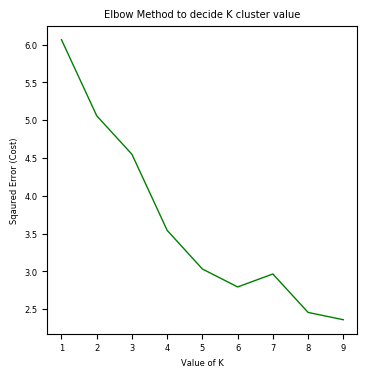

In [37]:
cost =[] 
for i in range(1, 10): 
    KM = KMeans(n_clusters=i, max_iter = 100).fit(Canada_clustering)
    
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)      
  
# plot the cost against K values 
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams.update({'font.size': 6})
plt.title('Elbow Method to decide K cluster value')
plt.plot(range(1, 10), cost, color ='g', linewidth ='1') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show()

  
# the point of the elbow shape happens to start is the most optimal value for deciding k 


In [38]:
# Here we add the clustering labels
City_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Canada_merged = df1

# Lets merge City_venues_sorted with df1 to add latitude/longitude for each City
Canada_merged = Canada_merged.join(City_venues_sorted.set_index('City'), on='City')


Canada_merged.head(20) # check the last columns!

,City,Province,Population 2016,"Area(km2, 2011)",Population/km2,City_Lat,City_Long,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
0,"Toronto, Ontario",Ontario,2731571,630.2,4334,43.653482,-79.383935,0.0,Coffee Shop,Café,Japanese Restaurant,Hotel,Art Gallery,Park,Sandwich Place,Thai Restaurant,Diner,Yoga Studio,Cosmetics Shop,Italian Restaurant,Gym,Farmers Market,Ramen Restaurant
1,"Montreal, Quebec",Quebec,1704694,365.1,4669,45.497216,-73.610364,5.0,Middle Eastern Restaurant,Coffee Shop,Park,Café,Fast Food Restaurant,Bakery,Grocery Store,Supermarket,Farmers Market,Pharmacy,Hotel,Bookstore,Sushi Restaurant,Pub,Bar
2,"Calgary, Alberta",Alberta,1239220,825.3,1501,51.053423,-114.062589,0.0,Hotel,Restaurant,Coffee Shop,Steakhouse,Pub,Italian Restaurant,Café,Bar,Park,Bakery,Burger Joint,Theater,Trail,Museum,Music Venue
3,"Ottawa, Ontario",Ontario,934243,2790.2,334,45.421106,-75.690308,0.0,Coffee Shop,Hotel,Restaurant,Café,Concert Hall,Seafood Restaurant,Yoga Studio,Tapas Restaurant,Food Truck,Mexican Restaurant,Museum,New American Restaurant,Cupcake Shop,Park,Bookstore
4,"Edmonton, Alberta",Alberta,932546,684.4,1362,53.535411,-113.507996,0.0,Coffee Shop,Italian Restaurant,Restaurant,Café,Sandwich Place,Breakfast Spot,Asian Restaurant,Park,Indian Restaurant,Bar,Nightclub,French Restaurant,Hotel,Gym,Sushi Restaurant
5,"Mississauga, Ontario",Ontario,721599,292.4,2467,43.589623,-79.644388,0.0,Coffee Shop,Chinese Restaurant,Clothing Store,Grocery Store,Indian Restaurant,Bakery,Pizza Place,Cosmetics Shop,Department Store,Dessert Shop,Performing Arts Venue,Sushi Restaurant,Bar,Mexican Restaurant,Farmers Market
6,"Winnipeg, Manitoba",Manitoba,705224,464.1,1519,49.895537,-97.138458,0.0,Sandwich Place,Coffee Shop,Asian Restaurant,French Restaurant,Café,Hotel,Restaurant,Pub,Theater,Concert Hall,Bakery,Pharmacy,Market,Sushi Restaurant,Museum
7,"Vancouver, British Columbia",British Columbia,631486,115.0,5491,49.260872,-123.113953,0.0,Coffee Shop,Café,Brewery,Chinese Restaurant,Japanese Restaurant,Ice Cream Shop,Indian Restaurant,Italian Restaurant,Bagel Shop,Pizza Place,Park,Bookstore,Ramen Restaurant,Sushi Restaurant,Taco Place
8,"Brampton, Ontario",Ontario,593638,266.3,2229,43.685815,-79.759934,0.0,Coffee Shop,Park,Italian Restaurant,Pizza Place,Pub,Bowling Alley,Bank,Baseball Field,Distribution Center,Thai Restaurant,Performing Arts Venue,Gastropub,Beer Store,Swim School,Sushi Restaurant
9,"Hamilton, Ontario",Ontario,536917,1117.2,480,43.256080,-79.872858,0.0,Coffee Shop,Café,Bar,Pub,Pizza Place,Middle Eastern Restaurant,Pharmacy,Restaurant,Soup Place,Italian Restaurant,Burrito Place,Sushi Restaurant,American Restaurant,Farmers Market,Fried Chicken Joint


In [39]:
Canada_merged.dropna(inplace = True)
Canada_merged.shape

(97, 23)

Visualizing the map of clustered Cities :

In [40]:
# create map
map_clusters = folium.Map(location=[43.6532 , -79.3832], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Canada_merged['City_Lat'], Canada_merged['City_Long'], 
                                  Canada_merged['City'], Canada_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

  Viewing the names of cities with their corresponding cluster labels:

In [41]:
pd.set_option('display.max_colwidth', -1)

df_pretty = Canada_merged.groupby('Cluster Labels')['City'].apply(', '.join)

df_pretty.reset_index().style.hide_index()

Cluster Labels,City
0,"Toronto, Ontario, Calgary, Alberta, Ottawa, Ontario, Edmonton, Alberta, Mississauga, Ontario, Winnipeg, Manitoba, Vancouver, British Columbia, Brampton, Ontario, Hamilton, Ontario, Surrey, British Columbia, Laval, Quebec, Halifax, Nova Scotia, London, Ontario, Markham, Ontario, Vaughan, Ontario, Gatineau, Quebec, Saskatoon, Saskatchewan, Kitchener, Ontario, Windsor, Ontario, Regina, Saskatchewan, Richmond, British Columbia, Richmond Hill, Ontario, Oakville, Ontario, Burlington, Ontario, Greater Sudbury, Ontario, Oshawa, Ontario, Saguenay, Quebec, Levis, Quebec, Barrie, Ontario, Abbotsford, British Columbia, Coquitlam, British Columbia, Trois-Rivires, Quebec, St. Catharines, Ontario, Guelph, Ontario, Whitby, Ontario, Kelowna, British Columbia, Kingston, Ontario, Ajax, Ontario, Langley, British Columbia, Saanich, British Columbia, Terrebonne, Quebec, Milton, Ontario, St. John's, Newfoundland and Labrador, Thunder Bay, Ontario, Waterloo, Ontario, Delta, British Columbia, Red Deer, Alberta, Brantford, Ontario, Saint-Jean-sur-Richelieu, Quebec, Pickering, Ontario, Nanaimo, British Columbia, Kamloops, British Columbia, Niagara Falls, Ontario, North Vancouver, British Columbia, Victoria, British Columbia, Repentigny, Quebec, Newmarket, Ontario, Chilliwack, British Columbia, Maple Ridge, British Columbia, Peterborough, Ontario, Kawartha Lakes, Ontario, Saint-Jerome, Quebec, Prince George, British Columbia, Sault Ste. Marie, Ontario, Moncton, New Brunswick, Sarnia, Ontario, New Westminster, British Columbia, Saint John, New Brunswick, Granby, Quebec, St. Albert, Alberta, Medicine Hat, Alberta, Grande Prairie, Alberta, Airdrie, Alberta, Port Coquitlam, British Columbia, Aurora, Ontario, North Vancouver, British Columbia, Welland, Ontario, North Bay, Ontario, Belleville, Ontario"
1,"Strathcona County, Alberta"
2,"Caledon, Ontario"
3,"Chatham-Kent, Ontario"
4,"Norfolk County, Ontario"
5,"Montreal, Quebec, Quebec City, Quebec, Longueuil, Quebec, Burnaby, British Columbia, Sherbrooke, Quebec, Cambridge, Ontario, Lethbridge, Alberta, Brossard, Quebec, Drummondville, Quebec, Halton Hills, Ontario, Fredericton, New Brunswick, Blainville, Quebec, Saint-Hyacinthe, Quebec, Mirabel, Quebec"


# 9.  Some Extra informative Visualizations to Understand General Venues Data

### Pandas Data frame as a Heatmap

In [42]:
Canada_grouped2= Canada_grouped.set_index('City').transpose()

In [43]:
Canada_grouped2.style.background_gradient(cmap="Greens", low = 0, high = 0.3)

### Seaborn Correlation Heatmap (General Venues Data)

This correlation map shows how similar the cities in terms of venues frequency ie. : the intersection of 2 cities with bright colors indicates that those 2 cities are more similar, but intersection with dark colors (color index towards to zero) tells us the considered 2 cities do not have much in common !

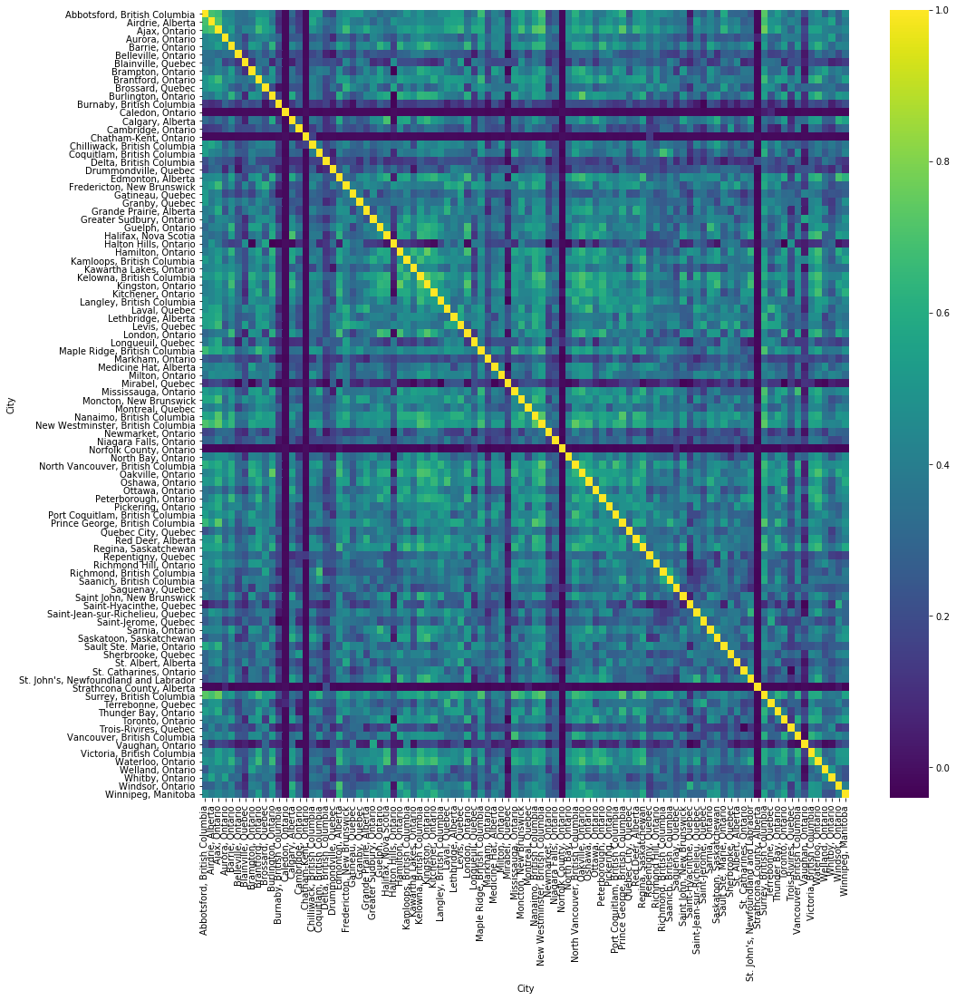

In [44]:
DE_Corr = Canada_grouped2.corr()

# plot the correlation heatmap
%matplotlib inline
plt.rcParams['figure.figsize'] = [16, 16]
plt.rcParams.update({'font.size': 10})
sns.heatmap(DE_Corr, xticklabels=DE_Corr.columns, yticklabels=DE_Corr.columns, cmap='viridis', annot=False)

### Seaborn Cluster map with Heatmap (General Venues Data)

This Heatmap from seaborn is one more step beyond of just a Heatmap , now we have also Clustermaps in the same graphic as a measure of closeness to each city. Height of the external lines tells about the similarity or dissimilarity metric of each city..

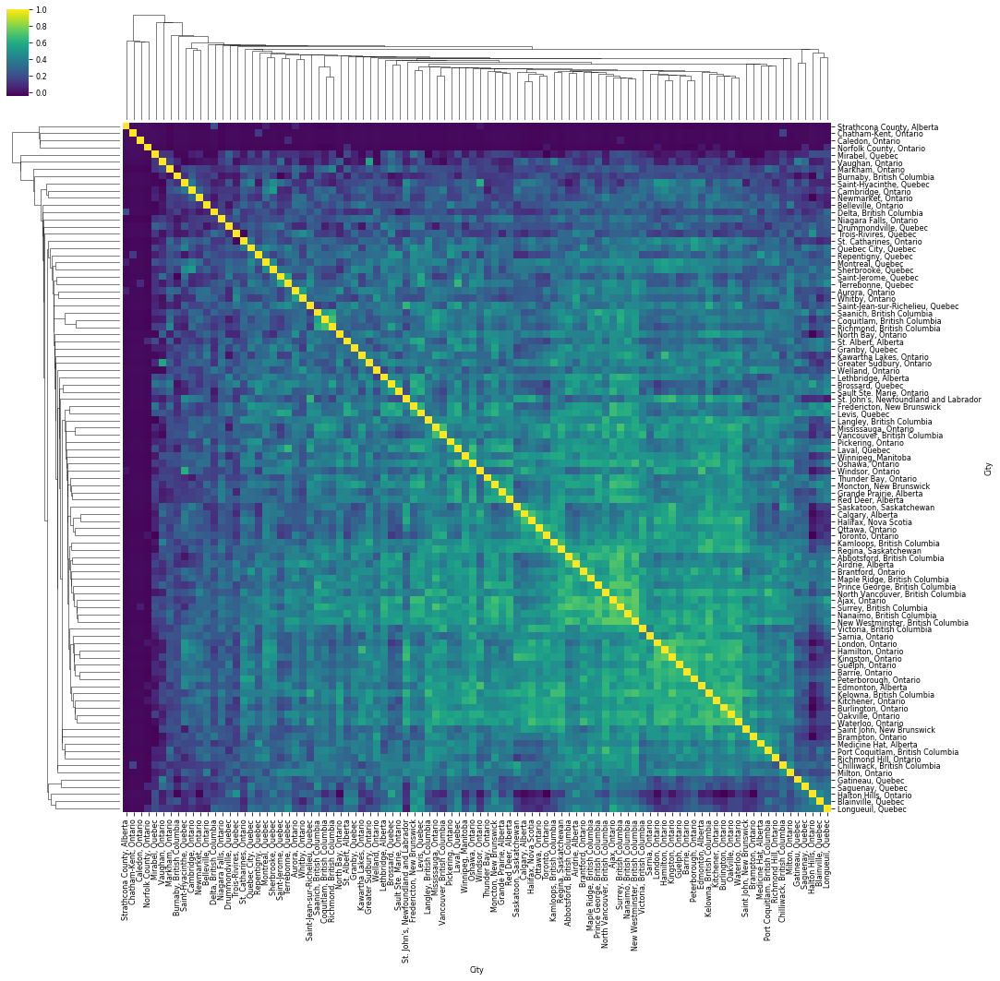

In [45]:
DE_Corr = Canada_grouped2.corr()

%matplotlib inline
plt.rcParams.update({'font.size': 8})
sns.clustermap(DE_Corr, xticklabels=DE_Corr.columns, yticklabels=DE_Corr.columns, 
               cmap='viridis', annot=False, method="single",figsize=(16,16))


### Target Business' script to Visualize A Single City

Lets create a heatmap with a targeted business..You can just change 'Target_Business' variable to get desired Venue's distribution on Cities
For example : If the Target_Business ='Coffee Shop' we see that City 'Kawartha Lake' in Ontario Province is the most competitive City with 0.18 percent venue occurrence in 1250 meters from the City center...

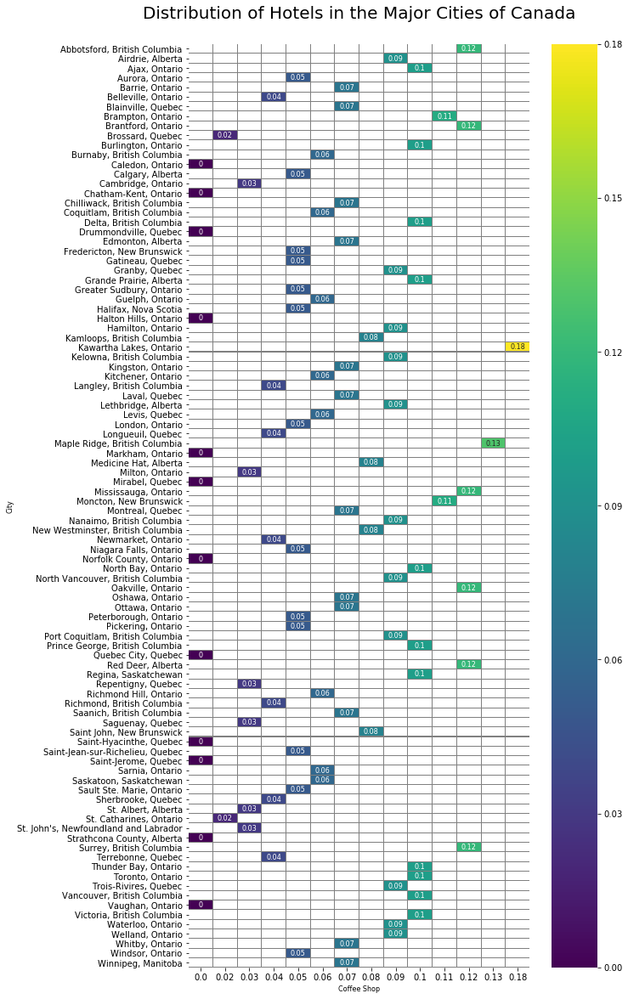

In [46]:
# below is the Generic code to see desired business

Target_Business ='Coffee Shop'

result = Canada_grouped.pivot(index='City', columns=Target_Business, values=Target_Business)


plt.rcParams.update(plt.rcParamsDefault)

%matplotlib inline

#sns.set(context='paper', style='white', palette='deep', font='sans-serif', font_scale=1 , color_codes=True, rc=None)
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10) # fontsize of the tick labels
plt.rcParams['figure.figsize'] = [9, 20]
#plt.rc('figure', titlesize=30) 
plt.rcParams.update({'font.size': 8})
plt.title('Distribution of Hotels in the Major Cities of Canada', fontdict = {'fontsize' : 20}, pad=30)
sns.heatmap(result, annot=True, cmap='viridis', linewidths = 0.01 , linecolor='grey', cbar=True, fmt="g")

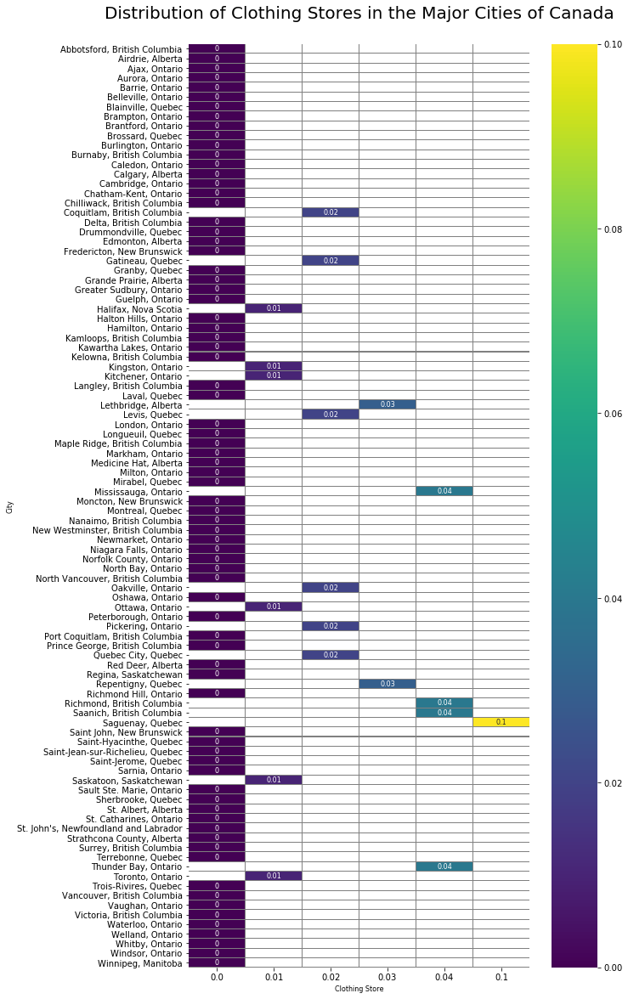

In [47]:
# This time our target Business is Clothing Store, lets see the distrubituon on big Cities..

Target_Business ='Clothing Store'
result = Canada_grouped.pivot(index='City', columns=Target_Business, values=Target_Business)

plt.rcParams.update(plt.rcParamsDefault)

%matplotlib inline

#sns.set(context='paper', style='white', palette='deep', font='sans-serif', font_scale=1 , color_codes=True, rc=None)
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10) # fontsize of the tick labels
plt.rcParams['figure.figsize'] = [9, 20]
#plt.rc('figure', titlesize=30) 
plt.rcParams.update({'font.size': 8})
plt.title('Distribution of Clothing Stores in the Major Cities of Canada', fontdict = {'fontsize' : 20}, pad=30)
sns.heatmap(result, annot=True, cmap='viridis', linewidths = 0.01 , linecolor='grey', cbar=True, fmt="g")

# 10. Analyzing the Investor Requirements

### Creating A Weighted "Wishes Matrix"

In this section we will create a Weighted Requirements (wishes) Matrix of the Customer to apply /integrate his desires to our work. This Part is covered longer in the assignment report part.. What we here summarizing are the , short form :

In [48]:
customer_says = [['away from other Clothing Stores', 0.9 , 'Negative'], ['close to Italian Restaurants', 0.5 , 'Positive'], ['close to Hotels', 0.7,'Positive'], \
                 ['less possible salaries(Income /Person ,CAD)', 0.8,'Negative'], ['highest possible unemployment rate ', 0.7,'Positive'], ['highest possible population ', 0.8,'Positive']] 

# Create the pandas DataFrame 
Wishes_Matrix = pd.DataFrame(customer_says, columns = ['Requirement', 'Importance (weight)' ,'Correlation'])

Wishes_Matrix

,Requirement,Importance (weight),Correlation
0,away from other Clothing Stores,0.9,Negative
1,close to Italian Restaurants,0.5,Positive
2,close to Hotels,0.7,Positive
3,"less possible salaries(Income /Person ,CAD)",0.8,Negative
4,highest possible unemployment rate,0.7,Positive
5,highest possible population,0.8,Positive


In [49]:
customer_says_short = [['Clothing Stores', -0.9 ], ['Italian Restaurants', 0.5 ], ['Hotels', 0.7,],\
                 ['Income /Person CAD', -0.8], ['Avg unemployment rate', 0.7], ['Population', 0.8]] 

# Create the pandas DataFrame 
Wishes_Matrix = pd.DataFrame(customer_says_short, columns = ['Requirement', 'weight'])

Wishes_Matrix

,Requirement,weight
0,Clothing Stores,-0.9
1,Italian Restaurants,0.5
2,Hotels,0.7
3,Income /Person CAD,-0.8
4,Avg unemployment rate,0.7
5,Population,0.8


Next, We will tend Answer is following :

1. Getting only the necessary and related 'Venue' columns (features) to a new data frame called Customer_Venues
2. Again getting only the necessary 'Social Data' columns (features) to a new data frame called Customer_Social
3. Merging these two newly created Data Frames based on Key 'City'. Calling New DF as Customer_Merged
4. Applying a Normalization to the Customer_Merged Data Frame.
5. Multiplying the Wishes_Matrix (already same features) with the Customer_Merged Data Frame.
6. Obtaining a Weighted_Customer Data Frame at hand , creating a Total_score Column on it
7. Making a City clusterization and visualization but this time for the Weighted_Customer DF..
8. Adding an analyze and conclusion getting help from the visualizations too..

So lets start with our already created and cleaned main Data Frames in 2 different category

**dfinal :** Our final Socioeconomic Data Frame. features like 'Avg Income/Person CAD' , 'Avg unemployment rate' , 'Population' are here. \
**Canada_grouped :** Our General Purpuse Venue Data Frame . features like frequency of 'Clothing Stores' , 'Italian Restaurants' , 'Hotels' are here.

In [50]:
dfinal.head()

,City,Province,Population 2016,"Area(km2, 2011)",Population/km2,City_Lat,City_Long,Avg Income/ person CAD,Average Unemployment rate
0,"Toronto, Ontario",Ontario,2731571,630.2,4334,43.653482,-79.383935,36600,10.6
1,"Ottawa, Ontario",Ontario,934243,2790.2,334,45.421106,-75.690308,36600,10.6
2,"Mississauga, Ontario",Ontario,721599,292.4,2467,43.589623,-79.644388,36600,10.6
3,"Brampton, Ontario",Ontario,593638,266.3,2229,43.685815,-79.759934,36600,10.6
4,"Hamilton, Ontario",Ontario,536917,1117.2,480,43.256080,-79.872858,36600,10.6


In [51]:
Canada_grouped.head()

,City,ATM,African Restaurant,Airport,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Bowling Green,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cha Chaan Teng,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Bookstore,College Cafeteria,College Gym,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Inn,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Lighting Store,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Noodle House,Office,Optical Shop,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Rest Area,Restaurant,Road,Rock Climbing Spot,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southe

### Preparing an Investor (customer) point of interest Data Frame

In [52]:
# We are creating a new venue Df just for investors point of view ..

Customer_Venues = Canada_grouped[['City','Clothing Store', 'Italian Restaurant', 'Hotel']].copy()

Customer_Venues.head(10)

,City,Clothing Store,Italian Restaurant,Hotel
0,"Abbotsford, British Columbia",0.0,0.00,0.03
1,"Airdrie, Alberta",0.0,0.00,0.00
2,"Ajax, Ontario",0.0,0.00,0.02
3,"Aurora, Ontario",0.0,0.02,0.00
4,"Barrie, Ontario",0.0,0.02,0.00
5,"Belleville, Ontario",0.0,0.00,0.00
6,"Blainville, Quebec",0.0,0.00,0.00
7,"Brampton, Ontario",0.0,0.05,0.00
8,"Brantford, Ontario",0.0,0.00,0.00
9,"Brossard, Quebec",0.0,0.02,0.05


In [53]:
Customer_Venues.shape

(96, 4)

In [54]:
#And again here we create a new data Frame , with only the investor interested features

Customer_Social = dfinal[['City','Avg Income/ person CAD', 'Average Unemployment rate','Population 2016']].copy()

Customer_Social.head()

,City,Avg Income/ person CAD,Average Unemployment rate,Population 2016
0,"Toronto, Ontario",36600,10.6,2731571
1,"Ottawa, Ontario",36600,10.6,934243
2,"Mississauga, Ontario",36600,10.6,721599
3,"Brampton, Ontario",36600,10.6,593638
4,"Hamilton, Ontario",36600,10.6,536917


In [55]:
Customer_Social.shape

(100, 4)

In [56]:
Customer_Merged = Customer_Venues.merge(Customer_Social, on="City")

Customer_Merged.head(10)

,City,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016
0,"Abbotsford, British Columbia",0.0,0.00,0.03,36700,10.7,141397
1,"Airdrie, Alberta",0.0,0.00,0.00,40800,11.8,61581
2,"Ajax, Ontario",0.0,0.00,0.02,36600,10.6,119677
3,"Aurora, Ontario",0.0,0.02,0.00,36600,10.6,55445
4,"Barrie, Ontario",0.0,0.02,0.00,36600,10.6,141434
5,"Belleville, Ontario",0.0,0.00,0.00,36600,10.6,50716
6,"Blainville, Quebec",0.0,0.00,0.00,34700,8.7,56863
7,"Brampton, Ontario",0.0,0.05,0.00,36600,10.6,593638
8,"Brantford, Ontario",0.0,0.00,0.00,36600,10.6,97496
9,"Brossard, Quebec",0.0,0.02,0.05,34700,8.7,85721


In [57]:
Customer_Merged.shape

(97, 7)

In [58]:
Customer_Merged = Customer_Merged.set_index('City')
Customer_Merged.head()

,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016
City,,,,,,
"Abbotsford, British Columbia",0.0,0.00,0.03,36700,10.7,141397
"Airdrie, Alberta",0.0,0.00,0.00,40800,11.8,61581
"Ajax, Ontario",0.0,0.00,0.02,36600,10.6,119677
"Aurora, Ontario",0.0,0.02,0.00,36600,10.6,55445
"Barrie, Ontario",0.0,0.02,0.00,36600,10.6,141434


### Applying a Normalization to the Customer_Merged Data Frame 

In [59]:
for i in Customer_Merged.columns:
    print('Max value of',i,':',Customer_Merged[i].max())

Max value of Clothing Store : 0.1
Max value of Italian Restaurant : 0.14
Max value of Hotel : 0.24
Max value of Avg Income/ person CAD : 40800
Max value of Average Unemployment rate : 13.1
Max value of Population 2016 : 2731571


In [60]:
for i in Customer_Merged.columns:
    Customer_Merged[i]= Customer_Merged[i]/Customer_Merged[i].max()

In [61]:
#Normalized view of the Data Frame 
Customer_Merged.head(10)

,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016
City,,,,,,
"Abbotsford, British Columbia",0.0,0.000000,0.125000,0.899510,0.816794,0.051764
"Airdrie, Alberta",0.0,0.000000,0.000000,1.000000,0.900763,0.022544
"Ajax, Ontario",0.0,0.000000,0.083333,0.897059,0.809160,0.043813
"Aurora, Ontario",0.0,0.142857,0.000000,0.897059,0.809160,0.020298
"Barrie, Ontario",0.0,0.142857,0.000000,0.897059,0.809160,0.051778
"Belleville, Ontario",0.0,0.000000,0.000000,0.897059,0.809160,0.018567
"Blainville, Quebec",0.0,0.000000,0.000000,0.850490,0.664122,0.020817
"Brampton, Ontario",0.0,0.357143,0.000000,0.897059,0.809160,0.217325
"Brantford, Ontario",0.0,0.000000,0.000000,0.897059,0.809160,0.035692


In [62]:
# Multiplying the Wishes_Matrix (already same features) with the Customer_Merged Data Frame
Wishes_Matrix


,Requirement,weight
0,Clothing Stores,-0.9
1,Italian Restaurants,0.5
2,Hotels,0.7
3,Income /Person CAD,-0.8
4,Avg unemployment rate,0.7
5,Population,0.8


Since the Wishes_Matrix has only one dimensional numeric array in it, we will convert this column to a numpy array ...

In [63]:
# take elements as a numpy array 
Ar1 = Wishes_Matrix['weight'].to_numpy()

In [64]:
Weighted_Customer = Customer_Merged * Ar1

Weighted_Customer.head(5)

,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016
City,,,,,,
"Abbotsford, British Columbia",-0.0,0.000000,0.087500,-0.719608,0.571756,0.041411
"Airdrie, Alberta",-0.0,0.000000,0.000000,-0.800000,0.630534,0.018035
"Ajax, Ontario",-0.0,0.000000,0.058333,-0.717647,0.566412,0.035050
"Aurora, Ontario",-0.0,0.071429,0.000000,-0.717647,0.566412,0.016238
"Barrie, Ontario",-0.0,0.071429,0.000000,-0.717647,0.566412,0.041422


In [65]:
# lets take a copy from this new DF before adding on it a new column (total_score)..

Weighted_Customer_4_Clustering = Weighted_Customer

In [66]:
Weighted_Customer_4_Clustering.head()

,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016
City,,,,,,
"Abbotsford, British Columbia",-0.0,0.000000,0.087500,-0.719608,0.571756,0.041411
"Airdrie, Alberta",-0.0,0.000000,0.000000,-0.800000,0.630534,0.018035
"Ajax, Ontario",-0.0,0.000000,0.058333,-0.717647,0.566412,0.035050
"Aurora, Ontario",-0.0,0.071429,0.000000,-0.717647,0.566412,0.016238
"Barrie, Ontario",-0.0,0.071429,0.000000,-0.717647,0.566412,0.041422


### Obtaining a Weighted_Customer Data Frame at hand , creating a Total_score Column on it

Now It is time to add a Total Score for each data row, showing it at the end in a new column Total_Score ,
as you may see , Descending sorting of all cities by their Total_Scores, is also our ultimate results to offer investor (customer)..
Toronto seems to be best optimal place to open a clothing store , in respect to Customers wishes.Following it the Cities :
 Toronto--> Vaughan --> Calgary .are the closer candidates..

In [67]:
Weighted_Customer['Total_Score'] = Weighted_Customer.sum(axis=1)

In [68]:
Weighted_Customer.sort_values(by='Total_Score', ascending=False).head(10)

,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016,Total_Score
City,,,,,,,
"Toronto, Ontario",-0.09,0.071429,0.116667,-0.717647,0.566412,0.800000,0.746860
"Vaughan, Ontario",-0.00,0.000000,0.700000,-0.717647,0.566412,0.089687,0.638452
"Calgary, Alberta",-0.00,0.142857,0.204167,-0.800000,0.630534,0.362933,0.540491
"Edmonton, Alberta",-0.00,0.214286,0.058333,-0.800000,0.630534,0.273116,0.376270
"Montreal, Quebec",-0.00,0.000000,0.087500,-0.680392,0.464885,0.499257,0.371250
"Windsor, Ontario",-0.00,0.357143,0.087500,-0.717647,0.566412,0.063608,0.357016
"Saint-Hyacinthe, Quebec",-0.00,0.500000,0.000000,-0.680392,0.464885,0.016298,0.300791
"Greater Sudbury, Ontario",-0.00,0.000000,0.379167,-0.717647,0.566412,0.047308,0.275240
"Saint-Jerome, Quebec",-0.00,0.285714,0.175000,-0.680392,0.464885,0.021774,0.266981


### Bar Chart -Presenting Candidate Cities in accordance to Total Score Method

In [69]:
Weighted_Customer_desc = Weighted_Customer['Total_Score'].sort_values(ascending=True).tail(40).copy()

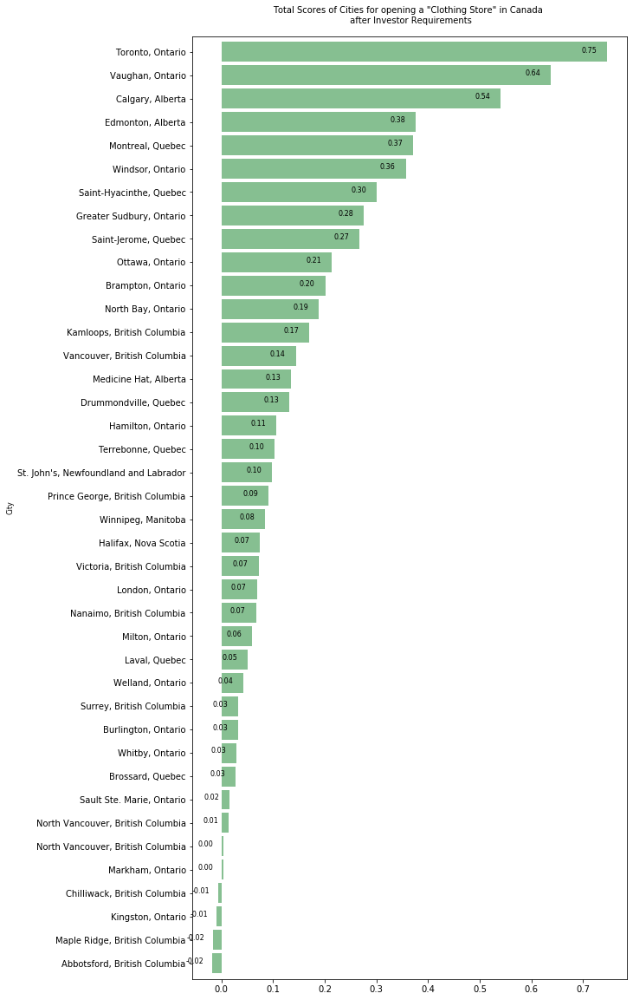

In [70]:
fig, ax = plt.subplots()

#plt.rcParams.update(plt.rcParamsDefault)

plt.rc('xtick', labelsize=8)    # fontsize of the tick labels
plt.rc('ytick', labelsize=8) # fontsize of the tick labels
plt.rcParams['figure.figsize'] = [6, 12]
plt.title('Total Scores of Cities for opening a "Clothing Store" in Canada \n after Investor Requirements', fontdict = {'fontsize' : 10}, pad=15)    

for i, v in enumerate(Weighted_Customer_desc):
    ax.text(v-0.05, i*0.9995, str("%.2f" % v), color='black', fontsize=8)
    
Weighted_Customer_desc.plot(kind='barh', color='#86bf91', ax=ax, zorder=2, width=0.85)

## Cluster Analysis

### Clustering Customer_Weighted Cities with K-Means MLA (Elbow Curve for K):

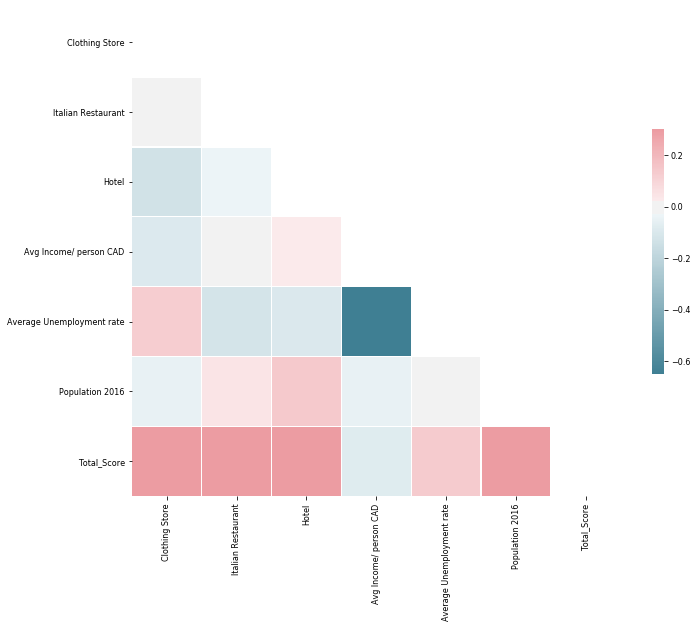

In [71]:
#EDA

def plot_corr(df):
    corr = df.corr()
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    

plot_corr(Weighted_Customer_4_Clustering)

From the Scikit-learn Machine Learning library we had already imported KMeans module. Now giving initially as an arbitrary k (number of clusters) we will start to our analyze:

In [72]:
# set number of clusters
kclusters2 = 4


# run k-means clustering
kmeans2 = KMeans(n_clusters=kclusters2, random_state=0).fit(Weighted_Customer_4_Clustering)

# check cluster labels generated for each row in the dataframe
kmeans2.labels_[0:11] 

array([0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0])

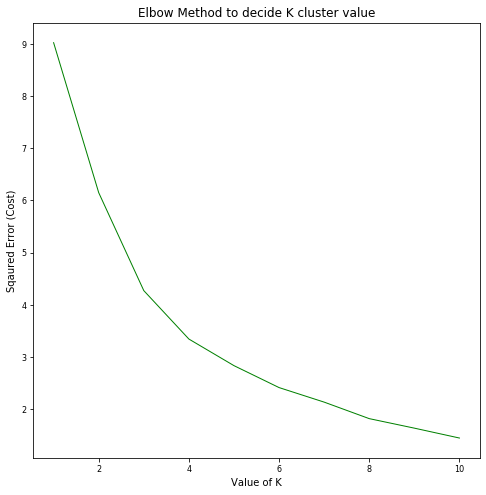

In [73]:
#Optimizing the number of clusters for K-means with the Elbow Curve Method:

cost =[] 
for i in range(1, 11): 
    KM = KMeans(n_clusters=i, max_iter = 100).fit(Weighted_Customer_4_Clustering)
    
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)      
  
# plot the cost against K values 
%matplotlib inline
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams.update({'font.size': 10})
plt.title('Elbow Method to decide K cluster value')
plt.plot(range(1, 11), cost, color ='g', linewidth ='1') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show()

  
# the point of the elbow shape happens to start is the most optimal value for deciding k 

In [74]:
#!pip install kneed
from kneed import KneeLocator
kl = KneeLocator(
    range(1, 11), cost, curve="convex", direction="decreasing"
)

kl.elbow

4

In [75]:
Weighted_Customer_4_Clustering

,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016,Total_Score
City,,,,,,,
"Abbotsford, British Columbia",-0.00,0.000000,0.087500,-0.719608,0.571756,0.041411,-0.018941
"Airdrie, Alberta",-0.00,0.000000,0.000000,-0.800000,0.630534,0.018035,-0.151430
"Ajax, Ontario",-0.00,0.000000,0.058333,-0.717647,0.566412,0.035050,-0.057851
"Aurora, Ontario",-0.00,0.071429,0.000000,-0.717647,0.566412,0.016238,-0.063568
"Barrie, Ontario",-0.00,0.071429,0.000000,-0.717647,0.566412,0.041422,-0.038384
"Belleville, Ontario",-0.00,0.000000,0.000000,-0.717647,0.566412,0.014853,-0.136382
"Blainville, Quebec",-0.00,0.000000,0.000000,-0.680392,0.464885,0.016654,-0.198853
"Brampton, Ontario",-0.00,0.178571,0.000000,-0.717647,0.566412,0.173860,0.201196
"Brantford, Ontario",-0.00,0.000000,0.000000,-0.717647,0.566412,0.028554,-0.122681


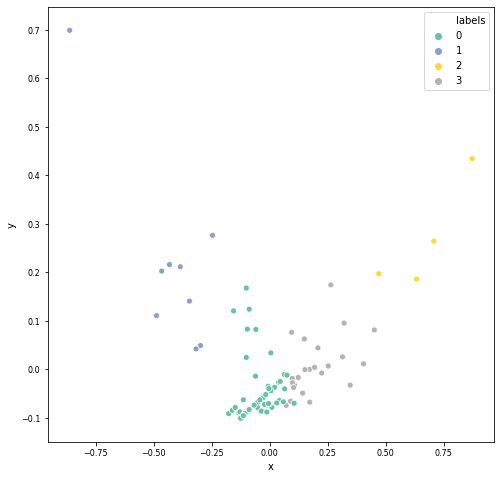

In [76]:
#Visualising the clusters
from sklearn.decomposition import PCA
import seaborn as sns

def prepare_pca(n_components, data, kmeans_labels):
    names = ['x', 'y', 'z']
    matrix = PCA(n_components=n_components).fit_transform(data)
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = kmeans_labels
    
    return df_matrix

df = Weighted_Customer_4_Clustering
pca_df = prepare_pca(2, df, kmeans2.labels_)
sns.scatterplot(x=pca_df.x, y=pca_df.y, hue=pca_df.labels, 
                palette="Set2")


In [77]:
# Here we add the clustering labels

Weighted_Customer_4_Clustering.insert(0, 'Cluster Labels', kmeans2.labels_)

Weighted_Customer_4_Clustering.reset_index(inplace=True)

Weighted_Customer_4_Clustering.head() 

,City,Cluster Labels,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016,Total_Score
0,"Abbotsford, British Columbia",0,-0.0,0.000000,0.087500,-0.719608,0.571756,0.041411,-0.018941
1,"Airdrie, Alberta",0,-0.0,0.000000,0.000000,-0.800000,0.630534,0.018035,-0.151430
2,"Ajax, Ontario",0,-0.0,0.000000,0.058333,-0.717647,0.566412,0.035050,-0.057851
3,"Aurora, Ontario",0,-0.0,0.071429,0.000000,-0.717647,0.566412,0.016238,-0.063568
4,"Barrie, Ontario",0,-0.0,0.071429,0.000000,-0.717647,0.566412,0.041422,-0.038384


In [78]:
#lets add the City_LAt , and City_Long columns again

geolocator = Nominatim(user_agent="DE_explorerv4")

# iterate geocode to get and add coordinates of all cities
City_Lat = []
City_Long = []
for address in Weighted_Customer_4_Clustering['City']:
    
    location = geolocator.geocode(address)
    if location:
        c_latitude = location.latitude
        c_longitude = location.longitude
        City_Lat.append(c_latitude)
        City_Long.append(c_longitude)

In [79]:
# Checking if all cities were parsed to new dataframes 
print(len(City_Lat),len(City_Long))

97 97


In [80]:
Weighted_Customer_4_Clustering['City_Lat']= City_Lat
Weighted_Customer_4_Clustering['City_Long']= City_Long

In [81]:
Weighted_Customer_4_Clustering

,City,Cluster Labels,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016,Total_Score,City_Lat,City_Long
0,"Abbotsford, British Columbia",0,-0.00,0.000000,0.087500,-0.719608,0.571756,0.041411,-0.018941,49.052116,-122.329479
1,"Airdrie, Alberta",0,-0.00,0.000000,0.000000,-0.800000,0.630534,0.018035,-0.151430,51.285970,-114.010620
2,"Ajax, Ontario",0,-0.00,0.000000,0.058333,-0.717647,0.566412,0.035050,-0.057851,43.850529,-79.020881
3,"Aurora, Ontario",0,-0.00,0.071429,0.000000,-0.717647,0.566412,0.016238,-0.063568,43.999730,-79.467545
4,"Barrie, Ontario",0,-0.00,0.071429,0.000000,-0.717647,0.566412,0.041422,-0.038384,44.389311,-79.690174
5,"Belleville, Ontario",0,-0.00,0.000000,0.000000,-0.717647,0.566412,0.014853,-0.136382,44.163326,-77.385256
6,"Blainville, Quebec",0,-0.00,0.000000,0.000000,-0.680392,0.464885,0.016654,-0.198853,45.679320,-73.876190
7,"Brampton, Ontario",3,-0.00,0.178571,0.000000,-0.717647,0.566412,0.173860,0.201196,43.685815,-79.759934
8,"Brantford, Ontario",0,-0.00,0.000000,0.000000,-0.717647,0.566412,0.028554,-0.122681,43.140816,-80.263173
9,"Brossard, Quebec",0,-0.00,0.071429,0.145833,-0.680392,0.464885,0.025105,0.026861,45.455483,-73.467890


### Presenting the Candidate Cities from the K-Means Clustering Algorithm (Customer Cluster Map)

In [82]:
# create map
map_clusters2 = folium.Map(location=[43.6532 , -79.3832], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters2)
ys = [i + x + (i*x)**2 for i in range(kclusters2)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Weighted_Customer_4_Clustering['City_Lat'], Weighted_Customer_4_Clustering['City_Long'],\
                                  Weighted_Customer_4_Clustering['City'], Weighted_Customer_4_Clustering['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters2)
       
map_clusters2

#### Tabular Form of Clustered Cities 

In [83]:
Weighted_Customer_4_Clustering['Total_Score'] = Weighted_Customer['Total_Score'].values
Weighted_Customer_4_Clustering.head()

,City,Cluster Labels,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016,Total_Score,City_Lat,City_Long
0,"Abbotsford, British Columbia",0,-0.0,0.000000,0.087500,-0.719608,0.571756,0.041411,-0.018941,49.052116,-122.329479
1,"Airdrie, Alberta",0,-0.0,0.000000,0.000000,-0.800000,0.630534,0.018035,-0.151430,51.285970,-114.010620
2,"Ajax, Ontario",0,-0.0,0.000000,0.058333,-0.717647,0.566412,0.035050,-0.057851,43.850529,-79.020881
3,"Aurora, Ontario",0,-0.0,0.071429,0.000000,-0.717647,0.566412,0.016238,-0.063568,43.999730,-79.467545
4,"Barrie, Ontario",0,-0.0,0.071429,0.000000,-0.717647,0.566412,0.041422,-0.038384,44.389311,-79.690174


In [84]:
pd.set_option('display.max_colwidth', -1)

df_pretty2 = Weighted_Customer_4_Clustering.groupby('Cluster Labels')['City','Total_Score'].agg(lambda x: list(x))

df_pretty2.reset_index().style.hide_index()

Cluster Labels,City,Total_Score
0,"['Abbotsford, British Columbia', 'Airdrie, Alberta', 'Ajax, Ontario', 'Aurora, Ontario', 'Barrie, Ontario', 'Belleville, Ontario', 'Blainville, Quebec', 'Brantford, Ontario', 'Brossard, Quebec', 'Burlington, Ontario', 'Burnaby, British Columbia', 'Caledon, Ontario', 'Cambridge, Ontario', 'Chatham-Kent, Ontario', 'Chilliwack, British Columbia', 'Delta, British Columbia', 'Fredericton, New Brunswick', 'Gatineau, Quebec', 'Granby, Quebec', 'Grande Prairie, Alberta', 'Guelph, Ontario', 'Halton Hills, Ontario', 'Kawartha Lakes, Ontario', 'Kelowna, British Columbia', 'Kingston, Ontario', 'Kitchener, Ontario', 'Langley, British Columbia', 'Levis, Quebec', 'Longueuil, Quebec', 'Maple Ridge, British Columbia', 'Markham, Ontario', 'Mirabel, Quebec', 'Moncton, New Brunswick', 'New Westminster, British Columbia', 'Newmarket, Ontario', 'Niagara Falls, Ontario', 'Norfolk County, Ontario', 'North Vancouver, British Columbia', 'North Vancouver, British Columbia', 'Oakville, Ontario', 'Oshawa, Ontario', 'Peterborough, Ontario', 'Port Coquitlam, British Columbia', 'Quebec City, Quebec', 'Red Deer, Alberta', 'Regina, Saskatchewan', 'Richmond Hill, Ontario', 'Saint John, New Brunswick', 'Saint-Jean-sur-Richelieu, Quebec', 'Sarnia, Ontario', 'Saskatoon, Saskatchewan', 'Sault Ste. Marie, Ontario', 'Sherbrooke, Quebec', 'St. Albert, Alberta', 'St. Catharines, Ontario', ""St. John's, Newfoundland and Labrador"", 'Strathcona County, Alberta', 'Surrey, British Columbia', 'Trois-Rivires, Quebec', 'Waterloo, Ontario', 'Whitby, Ontario']","[-0.01894093002561814, -0.15143031314521826, -0.05785149840576869, -0.06356799904988612, -0.03838424947866868, -0.1363815610205302, -0.19885309392253364, -0.12268102019622068, 0.026860504022524698, 0.032214553066338095, -0.07968475198741232, -0.13175828745378051, -0.11318494632517723, -0.12146530953008752, -0.006646312447186775, -0.11790949518464204, -0.15320794953978703, -0.11043563531232972, -0.053254964285255904, -0.15096611140929414, -0.07692181893699765, -0.13332251551155386, -0.12914557850350977, -0.023046113453030433, -0.010335050082842169, -0.11459737467989808, -0.055169320513485144, -0.09398094089969003, -0.14530530036344258, -0.01661880150376342, 0.0034433388874958865, -0.20071282958380696, -0.1492046854840477, -0.026464156542868662, -0.12656801416416075, -0.06710800317902921, -0.13247816623416, 0.013625340359411056, 0.003949736100909261, -0.06018121226256536, -0.03310552891822929, -0.12750286081467796, -0.05925774705665481, -0.16829901559701532, -0.14005605269216762, -0.11150277857433823, -0.09411840915663942, -0.03380146758001612, -0.18765045631948396, -0.04276698446366968, -0.1340113453783252, 0.016085903367789478, -0.03849780535328873, -0.04311362599757637, -0.11224980680290232, 0.09830358816858671, -0.1407513302449019, 0.03298902469030662, -0.17614088911438477, -0.09132074406452453, 0.029220295409864032]"
1,"['Coquitlam, British Columbia', 'Lethbridge, Alberta', 'Mississauga, Ontario', 'Pickering, Ontario', 'Repentigny, Quebec', 'Richmond, British Columbia', 'Saanich, British Columbia', 'Saguenay, Quebec', 'Thunder Bay, Ontario']","[-0.2870597680495977, -0.32480794363697557, -0.2284703061837663, -0.3043577110089434, -0.4608219645834098, -0.3914396792191531, -0.34465948778875855, -0.7322861300415882, -0.42129801325015687]"
2,"['Calgary, Alberta', 'Montreal, Quebec', 'Toronto, Ontario', 'Vaughan, Ontario']","[0.5404907002220938, 0.3712500674084368, 0.7468603930121667, 0.638452151886804]"
3,"['Brampton, Ontario', 'Drummondville, Quebec', 'Edmonton, Alberta', 'Greater Sudbury, Ontario', 'Halifax, Nova Scotia', 'Hamilton, Ontario', 'Kamloops, British Columbia', 'Laval, Quebec', 'London, Ontario', 'Medicine Hat, Alberta', 'Milton, Ontario', 'Nanaimo, British Columbia', 'North Bay, Ontario', 'Ottawa, Ontario', 'Prince George, British Columbia', 'Saint-Hyacinthe, Quebec', 'Saint-Jerome, Quebec', 'Terrebonne, Quebec', 'Vancouver, British Columbia', 'Victoria, British Columbia', '

### Short Conclusion

Plotting a Venn diagram to see intersection of 2 Methods used :

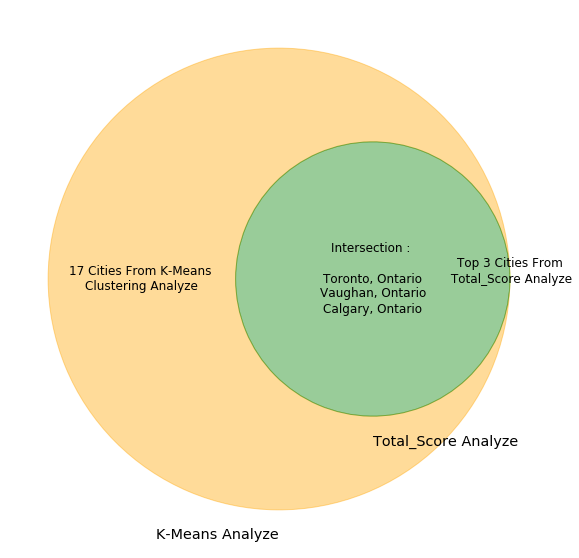

In [85]:
tmp1= Weighted_Customer.sort_values(by='Total_Score', ascending=False).head(6)
set2 = tmp1['City'].to_numpy()

%matplotlib inline
from matplotlib_venn import venn2
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams.update({'font.size': 12})

grp1 = set(['Vaughan, Ontario',
 'Toronto, Ontario',
 'Calgary, Alberta',
 'Windsor, Ontario',
 'Montreal, Quebec',
 'Edmonton, Alberta',
 'Saint-Jerome, Quebec',
 'Saint-Hyacinthe, Quebec',
 'Kamloops, British Columbia',
 'Ottawa, Ontario',
 'Greater Sudbury, Ontario',
 'Brampton, Ontario',
 'North Bay, Ontario',
 'Milton, Ontario',
 'Vancouver, British Columbia',
 'Drummondville, Quebec',
 'Prince George, British Columbia'])
grp2 = set(set2)

My_venn = venn2([grp1, grp2], set_labels = ('K-Means Analyze', 'Total_Score Analyze'))

My_venn.get_patch_by_id('10').set_color('orange')
My_venn.get_patch_by_id('01').set_color('yellow')
My_venn.get_patch_by_id('11').set_color('green')

My_venn.get_label_by_id('10').set_text('17 Cities From K-Means \nClustering Analyze')
My_venn.get_label_by_id('01').set_text('Top 3 Cities From\n Total_Score Analyze\n')
My_venn.get_label_by_id('11').set_text('Intersection : \n\nToronto, Ontario\nVaughan, Ontario\nCalgary, Ontario')

plt.show()

**Lets print the our candidate Cities from the K-Means analyze we want to see the Cities in cluster 1 too:**

In [86]:
Cluster1_Cities= Weighted_Customer_4_Clustering.loc[Weighted_Customer_4_Clustering['Cluster Labels']== 2]
Cluster1_Cities.drop(columns=['City_Lat','City_Long'], inplace=True)
Cluster1_Cities.set_index('City').sort_values(by='Total_Score', ascending=False)

C:\Users\samue\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Cluster Labels,Clothing Store,Italian Restaurant,Hotel,Avg Income/ person CAD,Average Unemployment rate,Population 2016,Total_Score
City,,,,,,,,
"Toronto, Ontario",2,-0.09,0.071429,0.116667,-0.717647,0.566412,0.800000,0.746860
"Vaughan, Ontario",2,-0.00,0.000000,0.700000,-0.717647,0.566412,0.089687,0.638452
"Calgary, Alberta",2,-0.00,0.142857,0.204167,-0.800000,0.630534,0.362933,0.540491
"Montreal, Quebec",2,-0.00,0.000000,0.087500,-0.680392,0.464885,0.499257,0.371250


# 11. Conclusion

Cluster analysis showed cluster 2 to consist mainly of the top major cities to be recommended to the investor. These cities also showed the highest total score above 50% with Montreal dropped since it score is lower.

#### Thus our Final List to advice to the Customer would be :

Toronto, Ontario\
Vaughan, Ontario\
Calgary, Alberta.
